Author: **Stefano Petrocchi**


## Dependencies and Variables:

In [1]:
import tensorflow as tf
from tensorflow import keras

import numpy as np
import datetime
import os
from tensorflow.keras import layers
from tensorflow.keras import models
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow.python.framework.ops import disable_eager_execution
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import Normalizer
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from tensorflow.python.util import deprecation
import pickle

deprecation._PRINT_DEPRECATION_WARNINGS = False

disable_eager_execution() #To execute the gradient

BASE_PATH = "drive/MyDrive/Petrocchi"
MODELS_PATH = BASE_PATH + "/models"
DATA_PATH = BASE_PATH + "/data/"
CHECKPOINT_PATH = BASE_PATH + "/checkpoints"
HISTORY_PATH = BASE_PATH + "/history"

labels_dict = {
  "0": "BASELINE",
  "1": "MASS BENIGN",
  "2": "MASS MALIGNANT",
  "3": "CALCIFICATION BENIGN",
  "4": "CALCIFICATION MALIGNANT"
}

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!pip install -q pyyaml h5py

In [4]:
!pip install import_ipynb

  Created wheel for import-ipynb: filename=import_ipynb-0.1.3-cp36-none-any.whl size=2976 sha256=ad904a771cee71a1e938d466d0aa22ee93ec04f966dcbabf5fdd08ce581b5691
  Stored in directory: /root/.cache/pip/wheels/b4/7b/e9/a3a6e496115dffdb4e3085d0ae39ffe8a814eacc44bbf494b5
Successfully built import-ipynb


In [5]:
# Get util functions
import import_ipynb
import drive.MyDrive.Petrocchi.util.preprocessing as preprocessing
import drive.MyDrive.Petrocchi.util.models as my_models
import drive.MyDrive.Petrocchi.util.visualization as visual
import drive.MyDrive.Petrocchi.util.SVM as svm

importing Jupyter notebook from /content/drive/MyDrive/Petrocchi/util/preprocessing.ipynb
"load_images_and_lables" function loaded
"preprocess_normalize_images" function loaded
"deprocess_image_to_RGB" function loaded
"deprocess_image" function loaded
"datagen" class loaded
"binary_subdivision" function loaded
importing Jupyter notebook from /content/drive/MyDrive/Petrocchi/util/models.ipynb
"tiny_net" CNN loaded
"mammo_net" CNN loaded
importing Jupyter notebook from /content/drive/MyDrive/Petrocchi/util/visualization.ipynb
"plot_history" function loaded
"plot_roc_curve" function loaded
"plot_confusion_matrix" function loaded
"generate_pattern" function loaded
"display_filters_patterns" function loaded
"display_features_maps" function loaded
"generate_pattern_RGB" function loaded
"display_filters_patterns" function loaded
importing Jupyter notebook from /content/drive/MyDrive/Petrocchi/util/SVM.ipynb
"create_feature_extractor" function loaded
"extract_features" function loaded
"train_s

## Data Loading:

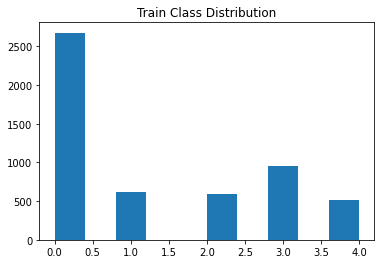

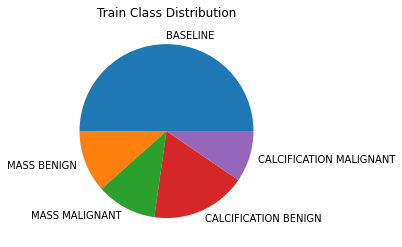

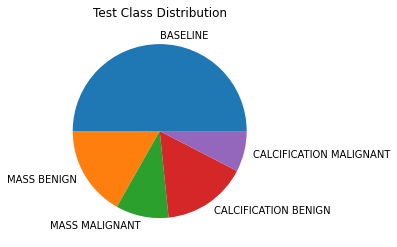

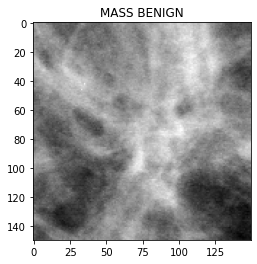

In [6]:
train_images, train_labels= preprocessing.load_images_and_lables(DATA_PATH + 'train_tensor.npy', DATA_PATH + 'train_labels.npy')
test_images, test_labels= preprocessing.load_images_and_lables(DATA_PATH + 'public_test_tensor.npy', DATA_PATH + 'public_test_labels.npy')

# Class Distribution
plt.hist(train_labels)
plt.title("Train Class Distribution")
plt.show()

unique, counts = np.unique(train_labels, return_counts=True)
plt.pie(counts, labels = ["BASELINE","MASS BENIGN","MASS MALIGNANT","CALCIFICATION BENIGN","CALCIFICATION MALIGNANT"])
plt.title('Train Class Distribution')
plt.show()

unique, counts = np.unique(test_labels, return_counts=True)
plt.pie(counts, labels = ["BASELINE","MASS BENIGN","MASS MALIGNANT","CALCIFICATION BENIGN","CALCIFICATION MALIGNANT"])
plt.title('Test Class Distribution')
plt.show()

# Plot an example
img_index = 5
plt.imshow(train_images[img_index,:,:],cmap = 'gray')
plt.title(labels_dict[str(train_labels[img_index])])
plt.show()

## General Data Preprocessing:

In [7]:
print(train_images.shape)
pp_train_images = preprocessing.preprocess_normalize_images(train_images, train_images.mean(), train_images.std())
print(pp_train_images.shape)

print(test_images.shape)
pp_test_images = preprocessing.preprocess_normalize_images(test_images, train_images.mean(), train_images.std())
print(pp_test_images.shape)

(5352, 150, 150)
(5352, 150, 150, 1)
(672, 150, 150)
(672, 150, 150, 1)


Test Augmentation:

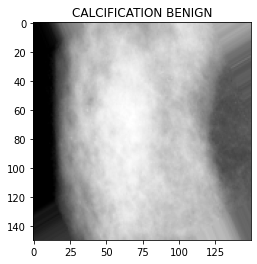

In [8]:
# Test: show random augmented image
for batch in preprocessing.datagen.flow(pp_train_images, train_labels, batch_size=1):
    plt.title(labels_dict[str(batch[1][0])])
    imgplot = plt.imshow(preprocessing.deprocess_image(batch[0][0][:,:,0]),cmap = 'gray')
    break

plt.show()

Binary subdivision:

Masses and Calcifications
(2676, 150, 150, 1)
(2676,)
(336, 150, 150, 1)
(336,)


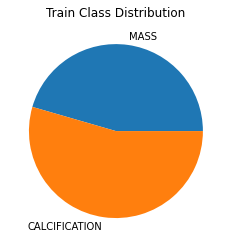

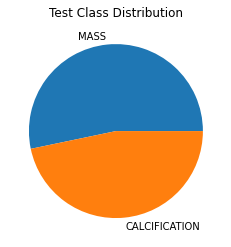

In [9]:
# 0: MASS, 1: CALCIFICATION
mc_train_images, mc_train_labels, mc_test_images, mc_test_labels = preprocessing.binary_subdivision( 
    [1,2], [3,4], pp_train_images, train_labels, pp_test_images, test_labels)  

print("Masses and Calcifications")
print(mc_train_images.shape)
print(mc_train_labels.shape)
print(mc_test_images.shape)
print(mc_test_labels.shape)

# Class Distribution
unique, counts = np.unique(mc_train_labels, return_counts=True)
plt.pie(counts, labels = ["MASS","CALCIFICATION"])
plt.title('Train Class Distribution')
plt.show()

unique, counts = np.unique(mc_test_labels, return_counts=True)
plt.pie(counts, labels = ["MASS","CALCIFICATION"])
plt.title('Test Class Distribution')
plt.show()

## Mass VS Calcification Classifiers

### Split:

(2140, 150, 150, 1)
(2140,)
(536, 150, 150, 1)
(536,)


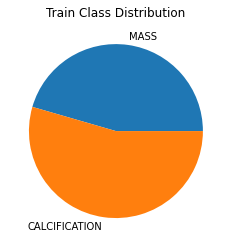

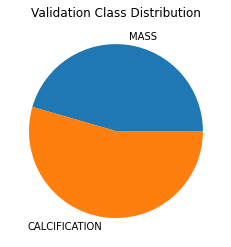

In [10]:
mc_train_images, mc_val_images, mc_train_labels, mc_val_labels = train_test_split(mc_train_images, mc_train_labels, test_size=0.2, random_state=171997, stratify=mc_train_labels)

print(mc_train_images.shape)
print(mc_train_labels.shape)
print(mc_val_images.shape)
print(mc_val_labels.shape)

# Class Distribution
unique, counts = np.unique(mc_train_labels, return_counts=True)
plt.pie(counts, labels = ["MASS","CALCIFICATION"])
plt.title('Train Class Distribution')
plt.show()

unique, counts = np.unique(mc_val_labels, return_counts=True)
plt.pie(counts, labels = ["MASS","CALCIFICATION"])
plt.title('Validation Class Distribution')
plt.show()

###General Parameters for training:

In [ ]:
K.clear_session()

In [ ]:
# Training parameters that are good for all models

# From ISMMS paper 32
# From Girona & Manchester paper 128
BATCH_SIZE = 107 # to have even batches 
STEPS_PER_EPOCH = len(mc_train_images) // BATCH_SIZE # 20
OPTIMIZER = tf.keras.optimizers.Adam(learning_rate=0.00001) # From Ecuador/Brazil paper
LOSS = 'binary_crossentropy'

# Large values ensures to not lose better weights 
MAX_EPOCHS = 1000 
PATIENCE = 50 

# Automatically restore best weights after early stopping
es_callback = tf.keras.callbacks.EarlyStopping(monitor = 'val_loss', patience = PATIENCE, restore_best_weights = True)

### Tiny-Net no Augmentation:

In [ ]:
# Model based on my tiny_net (need to be cloned to work properly)
tiny_mc_model_no_aug = keras.models.clone_model(my_models.tiny_net)
tiny_mc_model_no_aug._name = "tiny_mass_calcification_no_augmentation_net"
tiny_mc_model_no_aug.build(input_shape=(150, 150, 1))

tiny_mc_model_no_aug.summary()

tiny_mc_model_no_aug.compile(loss=LOSS,
              optimizer = OPTIMIZER,                   
              metrics=['accuracy'])

# Save weights when model improves (In case of disconnection)
cp_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=CHECKPOINT_PATH + "/tiny_mc_model_no_aug/checkpoint.ckpt", 
    verbose=1, 
    save_weights_only=True,
    save_best_only=True ) 

Model: "tiny_mass_calcification_no_augmentation_net"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_conv (Conv2D)          (None, 148, 148, 16)      160       
_________________________________________________________________
input_max_pooling (MaxPoolin (None, 74, 74, 16)        0         
_________________________________________________________________
conv_1 (Conv2D)              (None, 72, 72, 32)        4640      
_________________________________________________________________
max_pooling_1 (MaxPooling2D) (None, 36, 36, 32)        0         
_________________________________________________________________
conv_2 (Conv2D)              (None, 34, 34, 64)        18496     
_________________________________________________________________
max_pooling_2 (MaxPooling2D) (None, 17, 17, 64)        0         
_________________________________________________________________
conv_3 (Conv2D)        

Training:

In [ ]:
tiny_mc_model_no_aug_history = tiny_mc_model_no_aug.fit(mc_train_images, mc_train_labels, epochs=MAX_EPOCHS, batch_size=BATCH_SIZE, validation_data = (mc_val_images, mc_val_labels), callbacks=[es_callback, cp_callback])

Train on 2140 samples, validate on 536 samples
Epoch 1/1000
2033/2140 [===========================>..] - ETA: 0s - loss: 0.6942 - accuracy: 0.4875
Epoch 00001: val_loss improved from inf to 0.69206, saving model to drive/MyDrive/Petrocchi/checkpoints/tiny_mc_model_no_aug/checkpoint.ckpt


/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


2140/2140 [==============================] - 1s 532us/sample - loss: 0.6942 - accuracy: 0.4916 - val_loss: 0.6921 - val_accuracy: 0.5765
Epoch 2/1000
2033/2140 [===========================>..] - ETA: 0s - loss: 0.6921 - accuracy: 0.5121
Epoch 00002: val_loss improved from 0.69206 to 0.69037, saving model to drive/MyDrive/Petrocchi/checkpoints/tiny_mc_model_no_aug/checkpoint.ckpt
2140/2140 [==============================] - 1s 392us/sample - loss: 0.6923 - accuracy: 0.5117 - val_loss: 0.6904 - val_accuracy: 0.5504
Epoch 3/1000
2033/2140 [===========================>..] - ETA: 0s - loss: 0.6913 - accuracy: 0.5273
Epoch 00003: val_loss improved from 0.69037 to 0.68892, saving model to drive/MyDrive/Petrocchi/checkpoints/tiny_mc_model_no_aug/checkpoint.ckpt
2140/2140 [==============================] - 1s 396us/sample - loss: 0.6910 - accuracy: 0.5285 - val_loss: 0.6889 - val_accuracy: 0.5448
Epoch 4/1000
2033/2140 [===========================>..] - ETA: 0s - loss: 0.6890 - accuracy: 0.5455

In [ ]:
# Save and load history
with open(HISTORY_PATH + '/tiny_mc_model_no_aug_history', 'wb') as file_pi:
         pickle.dump(tiny_mc_model_no_aug_history.history, file_pi)

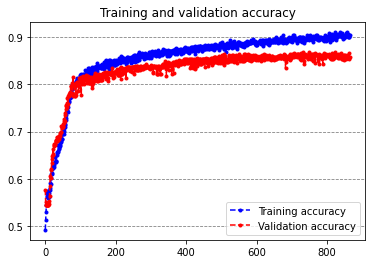

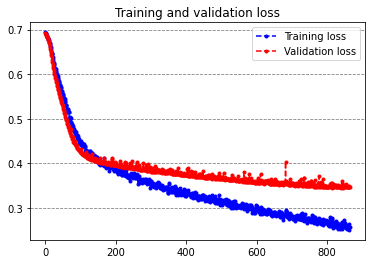

In [ ]:
tiny_mc_model_no_aug_history = pickle.load(open(HISTORY_PATH + '/tiny_mc_model_no_aug_history', "rb"))
visual.plot_history(tiny_mc_model_no_aug_history)

In [ ]:
train_loss, train_acc = tiny_mc_model_no_aug.evaluate(mc_train_images, mc_train_labels)
print(f"Accuracy on train set: {round(train_acc*100, 2)}% \nLoss on train set: {round(train_loss,4)}")
val_loss, val_acc = tiny_mc_model_no_aug.evaluate(mc_val_images, mc_val_labels)
print(f"Accuracy on validation set: {round(val_acc*100, 2)}% \nLoss on validation set: {round(val_loss,4)}")
test_loss, test_acc = tiny_mc_model_no_aug.evaluate(mc_test_images, mc_test_labels)
print(f"Accuracy on test set: {round(test_acc*100, 2)}% \nLoss on test set: {round(test_loss,4)}")

Accuracy on train set: 91.31% 
Loss on train set: 0.2426
Accuracy on validation set: 86.57% 
Loss on validation set: 0.3448
Accuracy on test set: 84.23% 
Loss on test set: 0.3553


Load best weights and save:

In [ ]:
# If disconnection occur best weights do far are restored 
# best = tf.train.latest_checkpoint(CHECKPOINT_PATH + "/tiny_mc_model_no_aug/")
# model.load_weights(best)

In [ ]:
if not os.path.exists(MODELS_PATH):
  os.makedirs(MODELS_PATH)
tiny_mc_model_no_aug.save(os.path.join(MODELS_PATH,'tiny_mc_model_no_aug.h5'))

### Tiny-Net with Augmentation:

In [ ]:
# Model based on my tiny_net (need to be cloned to work properly)
tiny_mc_model = keras.models.clone_model(my_models.tiny_net)
tiny_mc_model._name = "tiny_mass_calcification_net"
tiny_mc_model.build(input_shape=(150, 150, 1))

tiny_mc_model.summary()

tiny_mc_model.compile(loss=LOSS,
              optimizer = OPTIMIZER,                   
              metrics=['accuracy'])

# Save weights when model improves (In case of disconnection)
cp_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=CHECKPOINT_PATH + "/tiny_mc_model/checkpoint.ckpt", 
    verbose=1, 
    save_weights_only=True,
    save_best_only=True ) 

Model: "tiny_mass_calcification_net"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_conv (Conv2D)          (None, 148, 148, 16)      160       
_________________________________________________________________
input_max_pooling (MaxPoolin (None, 74, 74, 16)        0         
_________________________________________________________________
conv_1 (Conv2D)              (None, 72, 72, 32)        4640      
_________________________________________________________________
max_pooling_1 (MaxPooling2D) (None, 36, 36, 32)        0         
_________________________________________________________________
conv_2 (Conv2D)              (None, 34, 34, 64)        18496     
_________________________________________________________________
max_pooling_2 (MaxPooling2D) (None, 17, 17, 64)        0         
_________________________________________________________________
conv_3 (Conv2D)              (None, 15,

In [ ]:
tiny_mc_model_history = tiny_mc_model.fit(preprocessing.datagen.flow(mc_train_images, mc_train_labels, batch_size=BATCH_SIZE),
                       steps_per_epoch=STEPS_PER_EPOCH,  
                       epochs=MAX_EPOCHS, 
                       validation_data = (mc_val_images, mc_val_labels),
                       callbacks=[es_callback, cp_callback])

Epoch 1/1000
20/20 [==============================] - ETA: 0s - batch: 9.5000 - size: 107.0000 - loss: 0.6894 - accuracy: 0.5271

/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '



Epoch 00001: val_loss improved from inf to 0.66429, saving model to drive/MyDrive/Petrocchi/checkpoints/tiny_mc_model/checkpoint.ckpt
20/20 [==============================] - 5s 211ms/step - batch: 9.5000 - size: 107.0000 - loss: 0.6894 - accuracy: 0.5271 - val_loss: 0.6643 - val_accuracy: 0.5448
Epoch 2/1000
20/20 [==============================] - ETA: 0s - batch: 9.5000 - size: 107.0000 - loss: 0.6804 - accuracy: 0.5463
Epoch 00002: val_loss improved from 0.66429 to 0.62991, saving model to drive/MyDrive/Petrocchi/checkpoints/tiny_mc_model/checkpoint.ckpt
20/20 [==============================] - 2s 112ms/step - batch: 9.5000 - size: 107.0000 - loss: 0.6804 - accuracy: 0.5463 - val_loss: 0.6299 - val_accuracy: 0.5448
Epoch 3/1000
20/20 [==============================] - ETA: 0s - batch: 9.5000 - size: 107.0000 - loss: 0.6723 - accuracy: 0.5458
Epoch 00003: val_loss improved from 0.62991 to 0.60547, saving model to drive/MyDrive/Petrocchi/checkpoints/tiny_mc_model/checkpoint.ckpt
20/

In [ ]:
# Save and load history
with open(HISTORY_PATH + '/tiny_mc_model_history', 'wb') as file_pi:
        pickle.dump(tiny_mc_model_history.history, file_pi)

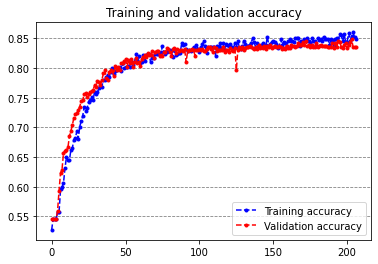

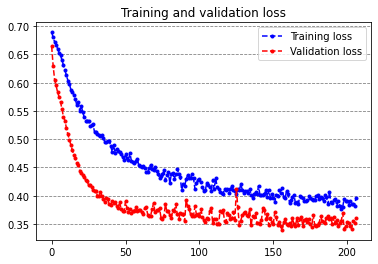

In [ ]:
tiny_mc_model_history = pickle.load(open(HISTORY_PATH + '/tiny_mc_model_history', "rb"))

visual.plot_history(tiny_mc_model_history)

In [ ]:
train_loss, train_acc = tiny_mc_model.evaluate(mc_train_images, mc_train_labels)
print(f"Accuracy on train set: {round(train_acc*100, 2)}% \nLoss on train set: {round(train_loss,4)}")
val_loss, val_acc = tiny_mc_model.evaluate(mc_val_images, mc_val_labels)
print(f"Accuracy on validation set: {round(val_acc*100, 2)}% \nLoss on validation set: {round(val_loss,4)}")
test_loss, test_acc = tiny_mc_model.evaluate(mc_test_images, mc_test_labels)
print(f"Accuracy on test set: {round(test_acc*100, 2)}% \nLoss on test set: {round(test_loss,4)}")

Accuracy on train set: 84.3% 
Loss on train set: 0.3938
Accuracy on validation set: 83.21% 
Loss on validation set: 0.4066
Accuracy on test set: 84.52% 
Loss on test set: 0.3793


In [ ]:
# If disconnection occur best weights do far are restored 
# best = tf.train.latest_checkpoint(CHECKPOINT_PATH + "/tiny_mc_model/")
# tiny_mc_model.load_weights(best)

In [ ]:
if not os.path.exists(MODELS_PATH):
  os.makedirs(MODELS_PATH)
tiny_mc_model.save(os.path.join(MODELS_PATH,'tiny_mc_model.h5'))

### Mammo-Net no Augmentation:

In [ ]:
# Model based on my mammo_net (need to be cloned to work properly)
mammo_mc_model_no_aug = keras.models.clone_model(my_models.mammo_net)
mammo_mc_model_no_aug._name = "mammo_mass_calcification_no_augmentation_net"
mammo_mc_model_no_aug.build(input_shape=(150, 150, 1))

mammo_mc_model_no_aug.summary()

mammo_mc_model_no_aug.compile(loss=LOSS,
              optimizer = OPTIMIZER,                   
              metrics=['accuracy'])

# Save weights when model improves (In case of disconnection)
cp_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=CHECKPOINT_PATH + "/mammo_mc_model_no_aug/checkpoint.ckpt", 
    verbose=1, 
    save_weights_only=True,
    save_best_only=True ) 

Model: "mammo_mass_calcification_no_augmentation_net"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_conv1 (Conv2D)         (None, 148, 148, 16)      160       
_________________________________________________________________
input_conv2 (Conv2D)         (None, 146, 146, 16)      2320      
_________________________________________________________________
input_max_pooling (MaxPoolin (None, 73, 73, 16)        0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 71, 71, 32)        4640      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 69, 69, 32)        9248      
_________________________________________________________________
block1_max_pooling (MaxPooli (None, 34, 34, 32)        0         
_________________________________________________________________
block2_conv1 (Conv2D) 

Training:

In [ ]:
mammo_mc_model_no_aug_history = mammo_mc_model_no_aug.fit(mc_train_images, mc_train_labels, epochs=MAX_EPOCHS, batch_size=BATCH_SIZE, validation_data = (mc_val_images, mc_val_labels), callbacks=[es_callback, cp_callback])

Train on 2140 samples, validate on 536 samples
Epoch 1/1000
2140/2140 [==============================] - ETA: 0s - loss: 0.6834 - accuracy: 0.5748

/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '



Epoch 00001: val_loss improved from inf to 0.64128, saving model to drive/MyDrive/Petrocchi/checkpoints/mammo_mc_model_no_aug/checkpoint.ckpt
2140/2140 [==============================] - 6s 3ms/sample - loss: 0.6834 - accuracy: 0.5748 - val_loss: 0.6413 - val_accuracy: 0.6511
Epoch 2/1000
2140/2140 [==============================] - ETA: 0s - loss: 0.6356 - accuracy: 0.6388
Epoch 00002: val_loss improved from 0.64128 to 0.59137, saving model to drive/MyDrive/Petrocchi/checkpoints/mammo_mc_model_no_aug/checkpoint.ckpt
2140/2140 [==============================] - 4s 2ms/sample - loss: 0.6356 - accuracy: 0.6388 - val_loss: 0.5914 - val_accuracy: 0.6716
Epoch 3/1000
2140/2140 [==============================] - ETA: 0s - loss: 0.5975 - accuracy: 0.6607
Epoch 00003: val_loss improved from 0.59137 to 0.54661, saving model to drive/MyDrive/Petrocchi/checkpoints/mammo_mc_model_no_aug/checkpoint.ckpt
2140/2140 [==============================] - 3s 1ms/sample - loss: 0.5975 - accuracy: 0.6607 - 

In [ ]:
# Save and load history
with open(HISTORY_PATH + '/mammo_mc_model_no_aug_history', 'wb') as file_pi:
        pickle.dump(mammo_mc_model_no_aug_history.history, file_pi)

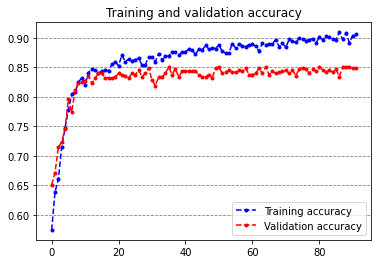

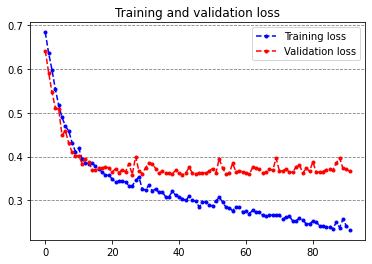

In [ ]:
mammo_mc_model_no_aug_history = pickle.load(open(HISTORY_PATH + '/mammo_mc_model_no_aug_history', "rb"))

visual.plot_history(mammo_mc_model_no_aug_history)

In [ ]:
train_loss, train_acc = mammo_mc_model_no_aug.evaluate(mc_train_images, mc_train_labels)
print(f"Accuracy on train set: {round(train_acc*100, 2)}% \nLoss on train set: {round(train_loss,4)}")
val_loss, val_acc = mammo_mc_model_no_aug.evaluate(mc_val_images, mc_val_labels)
print(f"Accuracy on validation set: {round(val_acc*100, 2)}% \nLoss on validation set: {round(val_loss,4)}")
test_loss, test_acc = mammo_mc_model_no_aug.evaluate(mc_test_images, mc_test_labels)
print(f"Accuracy on test set: {round(test_acc*100, 2)}% \nLoss on test set: {round(test_loss,4)}")

Accuracy on train set: 88.41% 
Loss on train set: 0.2882
Accuracy on validation set: 84.33% 
Loss on validation set: 0.3589
Accuracy on test set: 84.52% 
Loss on test set: 0.4109


Load best weights and save:

In [ ]:
# If disconnection occur best weights do far are restored 
# best = tf.train.latest_checkpoint(CHECKPOINT_PATH + "/tiny_mc_model_no_aug/")
# model.load_weights(best)

In [ ]:
if not os.path.exists(MODELS_PATH):
  os.makedirs(MODELS_PATH)
mammo_mc_model_no_aug.save(os.path.join(MODELS_PATH,'mammo_mc_model_no_aug.h5'))

### Mammo-Net with Augmentation:

In [ ]:
# Model based on my mammo_net (need to be cloned to work properly)
mammo_mc_model = keras.models.clone_model(my_models.mammo_net)
mammo_mc_model._name = "mammo_mass_calcification_net"
mammo_mc_model.build(input_shape=(150, 150, 1))

mammo_mc_model.summary()

mammo_mc_model.compile(loss=LOSS,
              optimizer = OPTIMIZER,                   
              metrics=['accuracy'])

# Save weights when model improves (In case of disconnection)
cp_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=CHECKPOINT_PATH + "/mammo_mc_model/checkpoint.ckpt", 
    verbose=1, 
    save_weights_only=True,
    save_best_only=True ) 

Model: "mammo_mass_calcification_net"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_conv1 (Conv2D)         (None, 148, 148, 16)      160       
_________________________________________________________________
input_conv2 (Conv2D)         (None, 146, 146, 16)      2320      
_________________________________________________________________
input_max_pooling (MaxPoolin (None, 73, 73, 16)        0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 71, 71, 32)        4640      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 69, 69, 32)        9248      
_________________________________________________________________
block1_max_pooling (MaxPooli (None, 34, 34, 32)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 32

In [ ]:
mammo_mc_model_history = mammo_mc_model.fit(preprocessing.datagen.flow(mc_train_images, mc_train_labels, batch_size=BATCH_SIZE),
                       steps_per_epoch=STEPS_PER_EPOCH,  
                       epochs=MAX_EPOCHS, 
                       validation_data = (mc_val_images, mc_val_labels),
                       callbacks=[es_callback, cp_callback])

Epoch 1/1000
20/20 [==============================] - ETA: 0s - batch: 9.5000 - size: 107.0000 - loss: 0.6854 - accuracy: 0.5294

/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '



Epoch 00001: val_loss improved from inf to 0.58882, saving model to drive/MyDrive/Petrocchi/checkpoints/mammo_mc_model/checkpoint.ckpt
20/20 [==============================] - 7s 234ms/step - batch: 9.5000 - size: 107.0000 - loss: 0.6854 - accuracy: 0.5294 - val_loss: 0.5888 - val_accuracy: 0.5448
Epoch 2/1000
20/20 [==============================] - ETA: 0s - batch: 9.5000 - size: 107.0000 - loss: 0.6582 - accuracy: 0.6192
Epoch 00002: val_loss improved from 0.58882 to 0.53251, saving model to drive/MyDrive/Petrocchi/checkpoints/mammo_mc_model/checkpoint.ckpt
20/20 [==============================] - 5s 235ms/step - batch: 9.5000 - size: 107.0000 - loss: 0.6582 - accuracy: 0.6192 - val_loss: 0.5325 - val_accuracy: 0.6586
Epoch 3/1000
20/20 [==============================] - ETA: 0s - batch: 9.5000 - size: 107.0000 - loss: 0.6144 - accuracy: 0.6467
Epoch 00003: val_loss improved from 0.53251 to 0.47473, saving model to drive/MyDrive/Petrocchi/checkpoints/mammo_mc_model/checkpoint.ckpt


In [ ]:
# Save and load history
with open(HISTORY_PATH + '/mammo_mc_model_history', 'wb') as file_pi:
        pickle.dump(mammo_mc_model_history.history, file_pi)

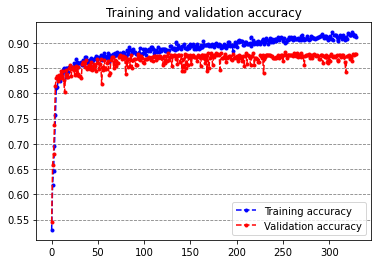

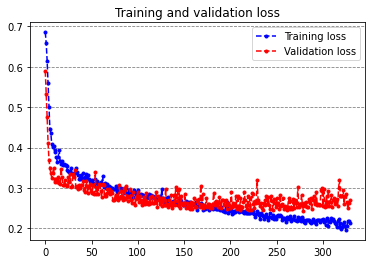

In [ ]:
mammo_mc_model_history = pickle.load(open(HISTORY_PATH + '/mammo_mc_model_history', "rb"))
visual.plot_history(mammo_mc_model_history)

In [ ]:
train_loss, train_acc = mammo_mc_model.evaluate(mc_train_images, mc_train_labels)
print(f"Accuracy on train set: {round(train_acc*100, 2)}% \nLoss on train set: {round(train_loss,4)}")
val_loss, val_acc = mammo_mc_model.evaluate(mc_val_images, mc_val_labels)
print(f"Accuracy on validation set: {round(val_acc*100, 2)}% \nLoss on validation set: {round(val_loss,4)}")
test_loss, test_acc = mammo_mc_model.evaluate(mc_test_images, mc_test_labels)
print(f"Accuracy on test set: {round(test_acc*100, 2)}% \nLoss on test set: {round(test_loss,4)}")

/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


Accuracy on train set: 92.48% 
Loss on train set: 0.1865
Accuracy on validation set: 86.94% 
Loss on validation set: 0.289
Accuracy on test set: 88.39% 
Loss on test set: 0.3024


In [ ]:
# If disconnection occur best weights do far are restored 
#best = tf.train.latest_checkpoint(CHECKPOINT_PATH + "/mammo_mc_model/")
#mammo_mc_model.load_weights(best)

In [ ]:
if not os.path.exists(MODELS_PATH):
  os.makedirs(MODELS_PATH)
mammo_mc_model.save(os.path.join(MODELS_PATH,'mammo_mc_model.h5'))

###Load Results:

In [11]:
tiny_mc_model_no_aug = keras.models.load_model(os.path.join(MODELS_PATH,'tiny_mc_model_no_aug.h5'))

In [12]:
tiny_mc_model = keras.models.load_model(os.path.join(MODELS_PATH,'tiny_mc_model.h5'))

In [13]:
mammo_mc_model_no_aug = keras.models.load_model(os.path.join(MODELS_PATH,'mammo_mc_model_no_aug.h5'))

In [14]:
mammo_mc_model = keras.models.load_model(os.path.join(MODELS_PATH,'mammo_mc_model.h5'))

### Support Vectors Machines 

Extract Features:

In [15]:
tiny_mc_model_no_aug_fe = svm.create_feature_extractor(tiny_mc_model_no_aug, -5, layers.Flatten(name = "flatten"))
tiny_mc_model_fe = svm.create_feature_extractor(tiny_mc_model, -5, layers.Flatten(name = "flatten"))

tiny_mc_model_no_aug_fe.summary()
tiny_mc_model_fe.summary()

mammo_mc_model_no_aug_fe = svm.create_feature_extractor(mammo_mc_model_no_aug, -7, layers.Flatten(name = "flatten"))

mammo_mc_model_fe = svm.create_feature_extractor(mammo_mc_model, -7, layers.Flatten(name = "flatten"))
mammo_mc_model_no_aug_fe.summary()
mammo_mc_model_fe.summary()


Model: "tiny_mass_calcification_no_augmentation_net_feature_extractor"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_conv (Conv2D)          (None, 148, 148, 16)      160       
_________________________________________________________________
input_max_pooling (MaxPoolin (None, 74, 74, 16)        0         
_________________________________________________________________
conv_1 (Conv2D)              (None, 72, 72, 32)        4640      
_________________________________________________________________
max_pooling_1 (MaxPooling2D) (None, 36, 36, 32)        0         
_________________________________________________________________
conv_2 (Conv2D)              (None, 34, 34, 64)        18496     
_________________________________________________________________
max_pooling_2 (MaxPooling2D) (None, 17, 17, 64)        0         
_________________________________________________________________
conv_

In [16]:
m1_train_features, m1_val_features, m1_test_features = svm.extract_features(tiny_mc_model_no_aug_fe, mc_train_images, mc_val_images, mc_test_images)
m2_train_features, m2_val_features, m2_test_features = svm.extract_features(tiny_mc_model_fe, mc_train_images, mc_val_images, mc_test_images)

m3_train_features, m3_val_features, m3_test_features = svm.extract_features(mammo_mc_model_no_aug_fe, mc_train_images, mc_val_images, mc_test_images)
m4_train_features, m4_val_features, m4_test_features = svm.extract_features(mammo_mc_model_fe, mc_train_images, mc_val_images, mc_test_images)

/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


Features extracted using tiny_mass_calcification_no_augmentation_net_feature_extractor


/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


Features extracted using tiny_mass_calcification_net_feature_extractor


/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


Features extracted using mammo_mass_calcification_no_augmentation_net_feature_extractor


/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


Features extracted using mammo_mass_calcification_net_feature_extractor


Train SVM on extracted features:

In [17]:
tiny_mc_model_no_aug_SVM = svm.train_svm_classifier(m1_train_features, mc_train_labels, m1_val_features, mc_val_labels, ker = "linear", gam='scale', c = 0.4)

Accuracy on training set: 92.24%
Accuracy on validation set: 86.38%


In [18]:
tiny_mc_model_SVM = svm.train_svm_classifier(m2_train_features, mc_train_labels, m2_val_features, mc_val_labels, ker = "linear", gam='scale', c = 3)

Accuracy on training set: 88.83%
Accuracy on validation set: 86.19%


In [19]:
mammo_mc_model_no_aug_SVM = svm.train_svm_classifier(m3_train_features, mc_train_labels, m3_val_features, mc_val_labels, ker = "linear", gam='scale', c = 9)

Accuracy on training set: 92.52%
Accuracy on validation set: 86.19%


In [20]:
mammo_mc_model_SVM = svm.train_svm_classifier(m4_train_features, mc_train_labels, m4_val_features, mc_val_labels, ker = "linear", gam='scale', c = 9)


Accuracy on training set: 93.22%
Accuracy on validation set: 87.87%


### Compare Results:

/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


Model: tiny_mc_model_no_aug --------------------
Accuracy on test set: 84.23% 
Loss on test set: 0.3553


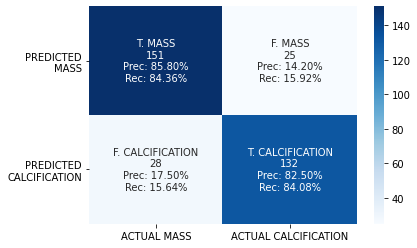


SVM Accuracy on test set: 84.82%


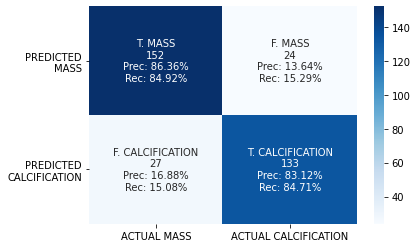

/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


Model: tiny_mc_model --------------------
Accuracy on test set: 84.52% 
Loss on test set: 0.3793


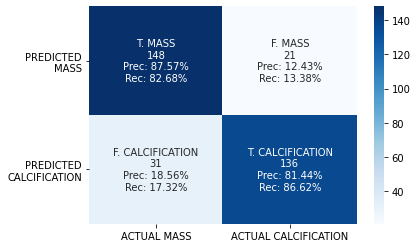


SVM Accuracy on test set: 87.5%


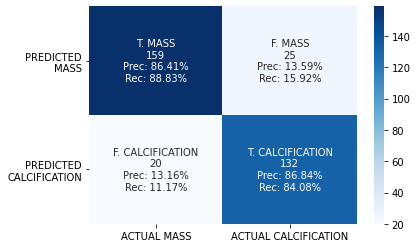

/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


Model: mammo_mc_model_no_aug --------------------
Accuracy on test set: 84.52% 
Loss on test set: 0.4109


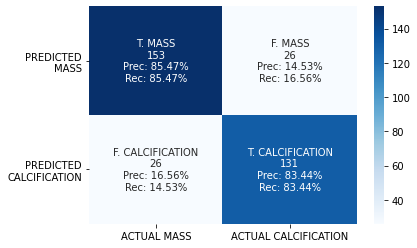


SVM Accuracy on test set: 84.23%


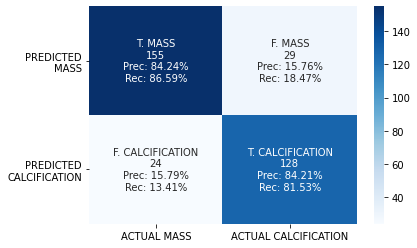

/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


Model: mammo_mc_model --------------------
Accuracy on test set: 88.39% 
Loss on test set: 0.3024


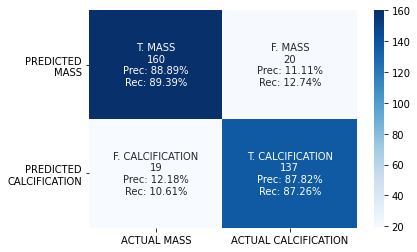


SVM Accuracy on test set: 86.9%


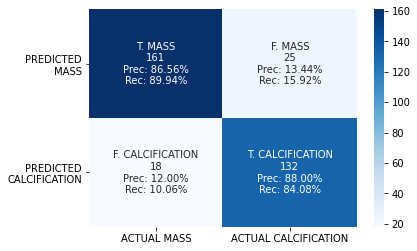

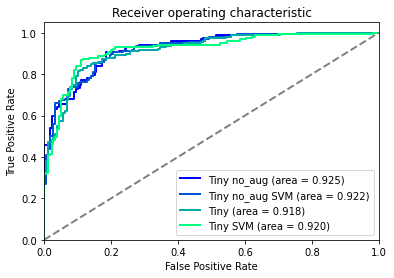

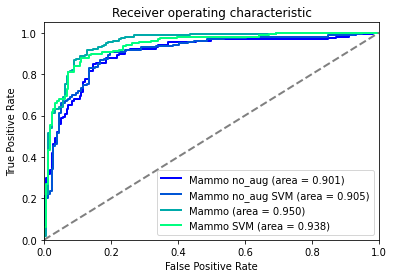

In [21]:
# tiny_mc_model_no_aug -----------------------------------------
test_loss, test_acc = tiny_mc_model_no_aug.evaluate(mc_test_images, mc_test_labels)
print(f"Model: tiny_mc_model_no_aug --------------------\nAccuracy on test set: {round(test_acc*100, 2)}% \nLoss on test set: {round(test_loss,4)}")

tiny_mc_model_no_aug_test_predictions = tiny_mc_model_no_aug.predict(mc_test_images)
binary_tiny_mc_model_no_aug_test_predictions = tiny_mc_model_no_aug_test_predictions.round()
visual.plot_confusion_matrix(mc_test_labels, binary_tiny_mc_model_no_aug_test_predictions, ["MASS", "CALCIFICATION"])

test_acc = tiny_mc_model_no_aug_SVM.score(m1_test_features, mc_test_labels)
print(f"\nSVM Accuracy on test set: {round(test_acc*100, 2)}%")

tiny_mc_model_no_aug_SVM_test_predictions = tiny_mc_model_no_aug_SVM.predict_proba(m1_test_features)
binary_tiny_mc_model_no_aug_SVM_test_predictions = tiny_mc_model_no_aug_SVM_test_predictions[:,1].round()
visual.plot_confusion_matrix(mc_test_labels, binary_tiny_mc_model_no_aug_SVM_test_predictions, ["MASS", "CALCIFICATION"])

# tiny_mc_model -----------------------------------------
test_loss, test_acc = tiny_mc_model.evaluate(mc_test_images, mc_test_labels)
print(f"Model: tiny_mc_model --------------------\nAccuracy on test set: {round(test_acc*100, 2)}% \nLoss on test set: {round(test_loss,4)}")

tiny_mc_model_test_predictions = tiny_mc_model.predict(mc_test_images)
binary_tiny_mc_model_test_predictions = tiny_mc_model_test_predictions.round()
visual.plot_confusion_matrix(mc_test_labels, binary_tiny_mc_model_test_predictions, ["MASS", "CALCIFICATION"])

test_acc = tiny_mc_model_SVM.score(m2_test_features, mc_test_labels)
print(f"\nSVM Accuracy on test set: {round(test_acc*100, 2)}%")

tiny_mc_model_SVM_test_predictions = tiny_mc_model_SVM.predict_proba(m2_test_features)
binary_tiny_mc_model_SVM_test_predictions = tiny_mc_model_SVM_test_predictions[:,1].round()
visual.plot_confusion_matrix(mc_test_labels, binary_tiny_mc_model_SVM_test_predictions, ["MASS", "CALCIFICATION"])

# mammo_mc_model_no_aug -----------------------------------------
test_loss, test_acc = mammo_mc_model_no_aug.evaluate(mc_test_images, mc_test_labels)
print(f"Model: mammo_mc_model_no_aug --------------------\nAccuracy on test set: {round(test_acc*100, 2)}% \nLoss on test set: {round(test_loss,4)}")

mammo_mc_model_no_aug_test_predictions = mammo_mc_model_no_aug.predict(mc_test_images)
binary_mammo_mc_model_no_aug_test_predictions = mammo_mc_model_no_aug_test_predictions.round()
visual.plot_confusion_matrix(mc_test_labels, binary_mammo_mc_model_no_aug_test_predictions, ["MASS", "CALCIFICATION"])

test_acc = mammo_mc_model_no_aug_SVM.score(m3_test_features, mc_test_labels)
print(f"\nSVM Accuracy on test set: {round(test_acc*100, 2)}%")

mammo_mc_model_no_aug_SVM_test_predictions = mammo_mc_model_no_aug_SVM.predict_proba(m3_test_features)
binary_mammo_mc_model_no_aug_SVM_test_predictions = mammo_mc_model_no_aug_SVM_test_predictions[:,1].round()
visual.plot_confusion_matrix(mc_test_labels, binary_mammo_mc_model_no_aug_SVM_test_predictions, ["MASS", "CALCIFICATION"])

# mammo_mc_model -----------------------------------------
test_loss, test_acc = mammo_mc_model.evaluate(mc_test_images, mc_test_labels)
print(f"Model: mammo_mc_model --------------------\nAccuracy on test set: {round(test_acc*100, 2)}% \nLoss on test set: {round(test_loss,4)}")

mammo_mc_model_test_predictions = mammo_mc_model.predict(mc_test_images)
binary_mammo_mc_model_test_predictions = mammo_mc_model_test_predictions.round()
visual.plot_confusion_matrix(mc_test_labels, binary_mammo_mc_model_test_predictions, ["MASS", "CALCIFICATION"])

test_acc = mammo_mc_model_SVM.score(m4_test_features, mc_test_labels)
print(f"\nSVM Accuracy on test set: {round(test_acc*100, 2)}%")

mammo_mc_model_SVM_test_predictions = mammo_mc_model_SVM.predict_proba(m4_test_features)
binary_mammo_mc_model_SVM_test_predictions = mammo_mc_model_SVM_test_predictions[:,1].round()
visual.plot_confusion_matrix(mc_test_labels, binary_mammo_mc_model_SVM_test_predictions, ["MASS", "CALCIFICATION"])

models_predictions = [tiny_mc_model_no_aug_test_predictions,
                      tiny_mc_model_no_aug_SVM_test_predictions[:,1],
                      tiny_mc_model_test_predictions,
                      tiny_mc_model_SVM_test_predictions[:,1]]

# ROC
visual.plot_roc_curve(mc_test_labels, models_predictions, ["Tiny no_aug", "Tiny no_aug SVM", "Tiny", "Tiny SVM"])

models_predictions = [mammo_mc_model_no_aug_test_predictions,
                      mammo_mc_model_no_aug_SVM_test_predictions[:,1],
                      mammo_mc_model_test_predictions,
                      mammo_mc_model_SVM_test_predictions[:,1]]

# ROC
visual.plot_roc_curve(mc_test_labels, models_predictions, ["Mammo no_aug", "Mammo no_aug SVM", "Mammo", "Mammo SVM"])


Visual Results:

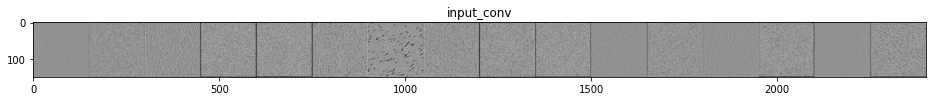

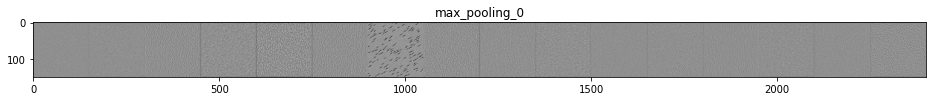

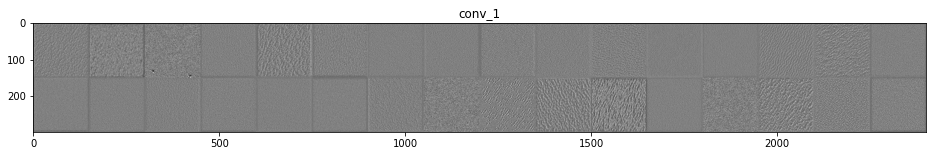

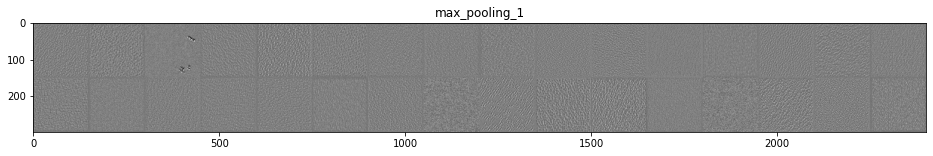

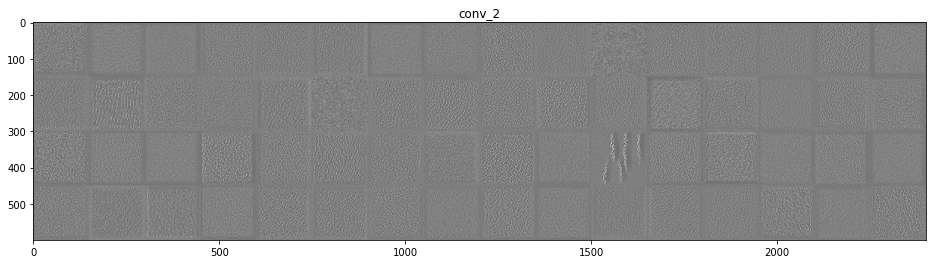

...

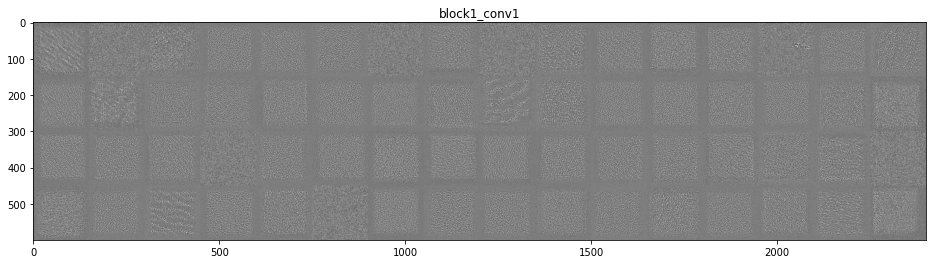

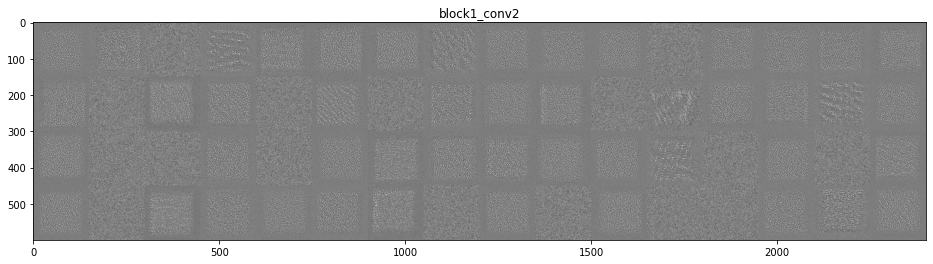

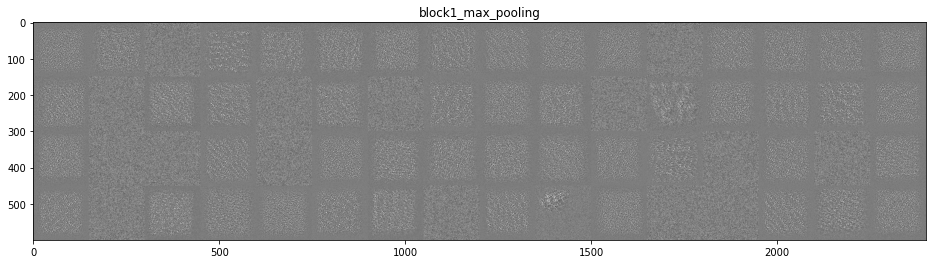

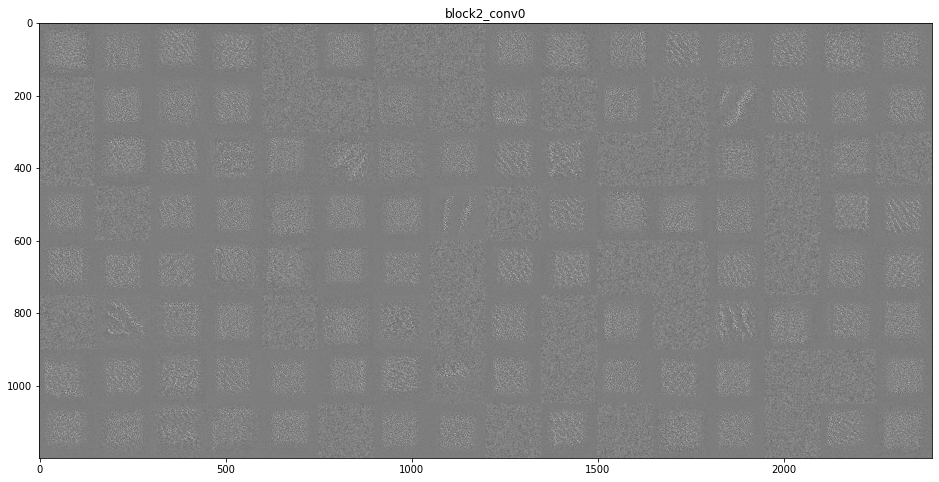

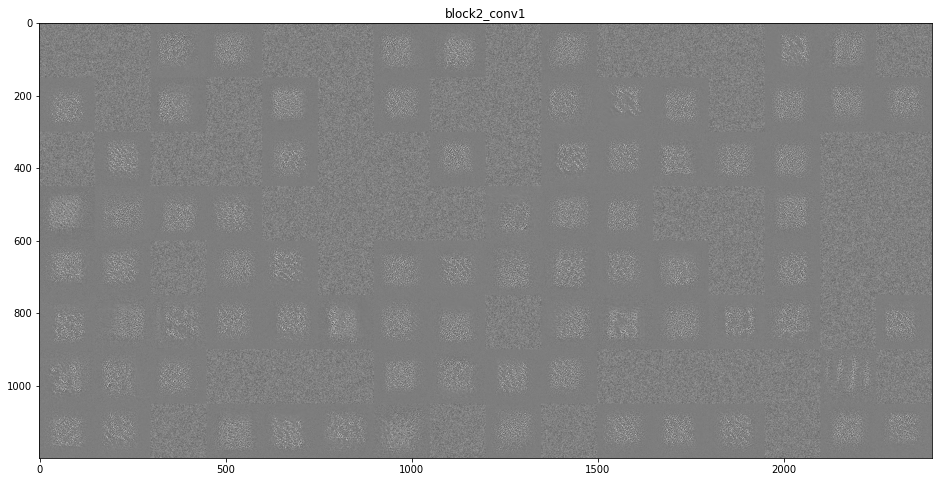

In [ ]:
# Filters patterns
visual.display_filters_patterns(top_k = 10, model = tiny_mc_model_no_aug, size = 150, images_per_row = 16, scale = 1, grad_steps = 40)
visual.display_filters_patterns(top_k = 10, model = tiny_mc_model, size = 150, images_per_row = 16, scale = 1, grad_steps = 40)

visual.display_filters_patterns(top_k = 13, model = mammo_mc_model_no_aug, size = 150, images_per_row = 16, scale = 1, grad_steps = 40)
visual.display_filters_patterns(top_k = 13, model = mammo_mc_model, size = 150, images_per_row = 16, scale = 1, grad_steps = 40)

In [ ]:
#Example Image
img_index = 33
IMG = mc_test_images[img_index:img_index + 1] # visualized image

plt.imshow(preprocessing.deprocess_image(IMG[0,:,:,0]),cmap = 'gray')
if mc_test_labels[img_index] == 0:
  plt.title("MASS")
else:
  plt.title("CALCIFICATION")
plt.show()

In [ ]:
# Feature Maps
visual.display_features_maps(top_k = 10, model = tiny_mc_model_no_aug, example_image = IMG, images_per_row = 16, scale = 1)
visual.display_features_maps(top_k = 10, model = tiny_mc_model, example_image = IMG, images_per_row = 16, scale = 1)

visual.display_features_maps(top_k = 13, model = mammo_mc_model_no_aug, example_image = IMG, images_per_row = 16, scale = 1)
visual.display_features_maps(top_k = 13, model = mammo_mc_model, example_image = IMG, images_per_row = 16, scale = 1)

Author: **Stefano Petrocchi**
